# Stock Behavioural Segmentation

In this module of the financial web app, I will be performing an unsupervised clustering of data on a number of well-known stocks stored in the financial database created. Stocks are clustered on the basis of historical OHLCV data(daily returns) and Technical Inidicators(RSI, MACD etc.), this allows for grouping of stocks based on their behavioural patterns(how they tend to move with time) in the market.

We’re capturing things like:

📈 Trend behavior: Are they in an uptrend or downtrend?

🔁 Momentum: Do they accelerate upward/downward suddenly?

🔄 Mean-reversion vs. breakout: Do they bounce around a mean (like value stocks), or break out like growth stocks?

📊 Volatility dynamics: Do they swing hard or stay tight in range?

📦 Volume reactions: Does volume spike on price moves, or is it steady?



## Libraries

In [77]:
import warnings
warnings.simplefilter(action='ignore',category=FutureWarning)

import numpy as np
import pandas as pd
pd.set_option('display.max_columns',None)

# Data Visualisation
import matplotlib.pyplot as plt
%config InlineBackend.figure_format = 'retina'

import seaborn as sns
sns.set_style('darkgrid')

## Parameters and Variables

Setting some default parameters and variables for our whole notebook

In [78]:
font_size = 20
plt.rcParams['axes.labelsize'] = font_size
plt.rcParams['axes.titlesize'] = font_size + 2
plt.rcParams['xtick.labelsize'] = font_size - 2
plt.rcParams['ytick.labelsize'] = font_size - 2
plt.rcParams['legend.fontsize'] = font_size - 2

## Getting the Data

Here's a brief description of the data used here:

| Field      | Description                                         |
| ---------- | --------------------------------------------------- |
| **O**pen   | Price at the beginning of the trading period        |
| **H**igh   | Highest price during the period                     |
| **L**ow    | Lowest price during the period                      |
| **C**lose  | Price at the end of the period                      |
| **V**olume | Number of shares/contracts traded during the period |





| Indicator    | Type               | Measures                     | Use Case                           |
| ------------ | ------------------ | ---------------------------- | ---------------------------------- |
| **RSI**      | Momentum           | Overbought/Oversold          | Entry/exit signals                 |
| **MACD**     | Momentum           | Trend direction & strength   | Bullish/bearish signals            |
| **SMA**      | Trend              | Average price (equal weight) | Trend detection                    |
| **EMA**      | Trend              | Average price (recent bias)  | Faster trend signals               |
| **ATR**      | Volatility         | Magnitude of price movement  | Risk measurement                   |
| **BB Bands** | Volatility + Trend | Price position & squeeze     | Mean-reversion or breakout signals |










In [79]:
# Importing the libraries to get the data from the database
from sqlalchemy import create_engine
import pandas as pd
import os
from dotenv import load_dotenv

# Loading the DB credentials from .env file
load_dotenv()

# Getting the database details and storing it
def get_db_url():
    user = os.getenv("DB_USER")
    password = os.getenv("DB_PASSWORD")
    host = os.getenv("DB_HOST")
    port = os.getenv("DB_PORT","5432")
    db = os.getenv("DB_NAME")
    return f"postgresql://{user}:{password}@{host}:{port}/{db}"



In [80]:
# Loading the data from the database
def load_data(join: bool = False, chunksize: int = None, columns: list = None, limit:int = None):
    engine = create_engine(get_db_url())

    # Building the SELECT clause
    cols = ", ".join(columns) if columns else "*"

    # Defining the query with optional join
    if join:
        query = f"""
        SELECT {cols}
        FROM stock_data sd
        JOIN technical_indicators ti
        ON sd.ticker = ti.ticker and sd.date = ti.date"""

    else:
        query = f"SELECT {cols} FROM stock_data"

    if limit:
        query += f" LIMIT {limit}"

    if chunksize:
        return pd.read_sql(query, engine, chunksize=chunksize)
    else:
        df = pd.read_sql(query,engine)
        engine.dispose()
        return df


In [81]:
# Specifying the columns to be imported
columns = [
    "sd.ticker","sd.date","sd.open","sd.high","sd.low","sd.close","sd.volume",
    "ti.ticker","ti.date","ti.rsi","ti.macd","ti.sma","ti.ema","ti.atr","ti.bb_upper","ti.bb_middle","ti.bb_lower"

]

# Getting the data in batches
data_chunks = load_data(join=True,columns=columns,chunksize=10000)

In [82]:
# Loading the chunks to view them
for chunk in data_chunks:
    print(chunk.head())

  ticker        date    open    high     low   close    volume ticker  \
0   AAPL  2025-05-20  207.67  208.47  205.03  206.86  42496600   AAPL   
1   AAPL  2025-05-19  207.91  209.48  204.26  208.78  46140500   AAPL   
2   AAPL  2025-05-16  212.36  212.57  209.77  211.26  54737900   AAPL   
3   AAPL  2024-12-05  243.99  244.54  242.13  243.04  40033900   AAPL   
4   AAPL  2024-12-04  242.87  244.11  241.25  243.01  44383900   AAPL   

         date      rsi    macd       sma       ema     atr  bb_upper  \
0  2025-05-20  50.9125  0.6616  207.9322  208.2333  6.3560  218.3768   
1  2025-05-19  51.9873  0.6951  206.6456  208.3341  6.6680  218.3950   
2  2025-05-16  54.7913  0.6309  205.5044  208.2227  6.6425  218.9238   
3  2024-12-05  73.2285  3.7637  237.5944  238.2509  3.5549  244.2530   
4  2024-12-04  73.1946  3.4206  235.9811  237.0537  3.6430  242.6695   

   bb_middle  bb_lower  
0   206.9875  195.5982  
1   206.5860  194.7770  
2   205.8050  192.6862  
3   231.6705  219.0880  
4  

In [83]:
# Loading all the chunks into a single dataframe
full_df = pd.concat(load_data(join=True,chunksize=10000,columns=columns),ignore_index=True)
full_df.head()

,ticker,date,open,high,low,close,volume,ticker,date,rsi,macd,sma,ema,atr,bb_upper,bb_middle,bb_lower
0,AAPL,2025-05-20,207.67,208.47,205.03,206.86,42496600,AAPL,2025-05-20,50.9125,0.6616,207.9322,208.2333,6.3560,218.3768,206.9875,195.5982
1,AAPL,2025-05-19,207.91,209.48,204.26,208.78,46140500,AAPL,2025-05-19,51.9873,0.6951,206.6456,208.3341,6.6680,218.3950,206.5860,194.7770
2,AAPL,2025-05-16,212.36,212.57,209.77,211.26,54737900,AAPL,2025-05-16,54.7913,0.6309,205.5044,208.2227,6.6425,218.9238,205.8050,192.6862
3,AAPL,2024-12-05,243.99,244.54,242.13,243.04,40033900,AAPL,2024-12-05,73.2285,3.7637,237.5944,238.2509,3.5549,244.2530,231.6705,219.0880
4,AAPL,2024-12-04,242.87,244.11,241.25,243.01,44383900,AAPL,2024-12-04,73.1946,3.4206,235.9811,237.0537,3.6430,242.6695,230.6545,218.6395


In [84]:
# Getting the number of datapoints
print("The number of rows is {} and the number of columns is {}".format(full_df.shape[0],full_df.shape[1]))


The number of rows is 11940 and the number of columns is 17


## Data Cleaning

In this section:

* Data Cleaning
* Feature Engineering

In [85]:
# Getting info on the dataset, to define the cleaning method

full_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11940 entries, 0 to 11939
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   ticker     11940 non-null  object 
 1   date       11940 non-null  object 
 2   open       11940 non-null  float64
 3   high       11940 non-null  float64
 4   low        11940 non-null  float64
 5   close      11940 non-null  float64
 6   volume     11940 non-null  int64  
 7   ticker     11940 non-null  object 
 8   date       11940 non-null  object 
 9   rsi        11940 non-null  float64
 10  macd       11940 non-null  float64
 11  sma        11940 non-null  float64
 12  ema        11940 non-null  float64
 13  atr        11940 non-null  float64
 14  bb_upper   11940 non-null  float64
 15  bb_middle  11940 non-null  float64
 16  bb_lower   11940 non-null  float64
dtypes: float64(12), int64(1), object(4)
memory usage: 1.5+ MB


**From the above output, we can conclude that:**

* There are no missing values whatsoever
* There are duplicate columns for ticker and data which will be removed
* date is stored as an object not datetime, this will be converted
* ticker is categorical and will be encoded into numerical forms later

In [86]:
# Dropping the duplicate columns
full_df = full_df.loc[:,~full_df.columns.duplicated()]
full_df.head()

,ticker,date,open,high,low,close,volume,rsi,macd,sma,ema,atr,bb_upper,bb_middle,bb_lower
0,AAPL,2025-05-20,207.67,208.47,205.03,206.86,42496600,50.9125,0.6616,207.9322,208.2333,6.3560,218.3768,206.9875,195.5982
1,AAPL,2025-05-19,207.91,209.48,204.26,208.78,46140500,51.9873,0.6951,206.6456,208.3341,6.6680,218.3950,206.5860,194.7770
2,AAPL,2025-05-16,212.36,212.57,209.77,211.26,54737900,54.7913,0.6309,205.5044,208.2227,6.6425,218.9238,205.8050,192.6862
3,AAPL,2024-12-05,243.99,244.54,242.13,243.04,40033900,73.2285,3.7637,237.5944,238.2509,3.5549,244.2530,231.6705,219.0880
4,AAPL,2024-12-04,242.87,244.11,241.25,243.01,44383900,73.1946,3.4206,235.9811,237.0537,3.6430,242.6695,230.6545,218.6395


### Feature Engineering

Now, we will engineer new features, that will help us in the model training, as it will help the model to better understand patterns



In [87]:
# First of all, we will convert date to datetime
full_df['date'] = pd.to_datetime(full_df['date'])

# Sorting by ticker and date
full_df = full_df.sort_values(by=['ticker','date'])

#### Daily Return

In [88]:
full_df['daily_return'] = full_df.groupby('ticker')['close'].pct_change()

#Grouping now
grouped = full_df.groupby('ticker')

#### Rolling Volatility

In [89]:
full_df['rolling_volatility'] = grouped['daily_return'].rolling(window=3).std().reset_index(level=0, drop=True)

#### Average Volume

In [90]:
full_df['avg_volume'] = grouped['volume'].rolling(window=3).mean().reset_index(level=0, drop=True)


#### Trend Strength

In [91]:
full_df['trend_strength'] = (full_df['close'] - full_df['sma'])/full_df['sma']

#### Volatility Range

In [92]:
full_df['volatility_range'] = full_df['high'] - full_df['low']

In [93]:
# Dropping rows from rolling operations
full_df = full_df.dropna().reset_index(drop=True)

In [94]:
full_df.head()

,ticker,date,open,high,low,close,volume,rsi,macd,sma,ema,atr,bb_upper,bb_middle,bb_lower,daily_return,rolling_volatility,avg_volume,trend_strength,volatility_range
0,AAPL,2023-01-06,126.01,130.29,124.89,129.62,87754700,42.1189,-4.5841,128.1711,128.8381,4.3780,146.7155,133.7440,120.7725,0.036794,0.023754,8.594367e+07,0.011304,5.40
1,AAPL,2023-01-09,130.47,133.41,129.89,130.15,70790800,43.0379,-4.2292,127.9811,129.1005,4.3360,145.5051,133.1190,120.7329,0.004089,0.024263,7.983607e+07,0.016947,3.52
2,AAPL,2023-01-10,130.26,131.26,128.12,130.73,63896200,44.0842,-3.8566,128.0589,129.4264,4.2505,144.2481,132.5475,120.8469,0.004456,0.018777,7.414723e+07,0.020858,3.14
3,AAPL,2023-01-11,131.25,133.51,130.46,133.49,69458900,48.8949,-3.3006,128.8867,130.2391,4.1648,142.3583,131.9975,121.6367,0.021112,0.009724,6.804863e+07,0.035716,3.05
4,AAPL,2023-01-12,133.88,134.26,131.44,133.41,71379600,48.7639,-2.8338,129.3089,130.8733,4.0687,139.7605,131.3945,123.0285,-0.000599,0.011361,6.824490e+07,0.031716,2.82


In [95]:
# Now, that we have some new features, lets look at the data stats
full_df.describe()

,date,open,high,low,close,volume,rsi,macd,sma,ema,atr,bb_upper,bb_middle,bb_lower,daily_return,rolling_volatility,avg_volume,trend_strength,volatility_range
count,11880,11880.000000,11880.000000,11880.000000,11880.000000,1.188000e+04,11880.000000,11880.000000,11880.000000,11880.000000,11880.000000,11880.000000,11880.000000,11880.000000,11880.000000,11880.000000,1.188000e+04,11880.000000,11880.000000
mean,2024-03-13 10:15:45.454545664,188.063928,190.043931,186.117580,188.171947,4.413464e+07,52.928694,0.930545,187.518160,187.539959,4.262106,197.105121,186.724286,176.343458,0.001004,0.013843,4.416498e+07,0.003441,3.926351
min,2023-01-06 00:00:00,14.470000,15.010000,14.030000,14.860000,9.550000e+05,14.075200,-35.583200,14.529800,14.801300,0.460700,17.379600,15.470900,12.704100,-0.169682,0.000017,1.202133e+06,-0.183869,0.180000
25%,2023-08-10 00:00:00,94.505000,95.685000,93.507500,94.752500,7.019212e+06,43.901650,-0.834975,94.231650,94.141000,1.883200,100.239600,93.598000,87.657925,-0.007426,0.006269,7.212483e+06,-0.011775,1.390000
50%,2024-03-13 12:00:00,160.045000,161.345000,158.880000,160.260000,1.563340e+07,53.268200,0.454450,160.332800,160.327700,3.007300,166.329050,159.830000,152.770850,0.000819,0.010471,1.599908e+07,0.003435,2.640000
75%,2024-10-15 00:00:00,245.162500,248.690000,242.222500,245.715000,3.692430e+07,62.204675,2.454300,244.968325,244.567725,5.901075,262.026250,242.412125,225.532000,0.008943,0.017231,3.723962e+07,0.017553,4.970000
max,2025-05-20 00:00:00,736.000000,740.910000,725.620000,736.670000,1.543911e+09,89.064400,40.538600,719.506700,716.377500,34.560900,760.723900,700.719000,659.261200,0.243615,0.166566,1.060570e+09,0.256322,85.780000
std,NaN,131.736667,133.132991,130.295921,131.774723,9.517610e+07,12.603924,4.681909,131.146865,131.121833,3.910643,138.054453,130.409854,123.328837,0.018724,0.012689,9.307587e+07,0.029138,4.255381


## Interactive Plots

### **CandleStick Chart**

We will now visualise the price and indicator trends of all the stocks(behaviour over time)

In [96]:
import plotly.graph_objects as go

#Ensuring that date is a datetime object
full_df['date'] = pd.to_datetime(full_df['date'])

# Getting the list of unique tickers
tickers = full_df['ticker'].unique()

#Creating a figure object
fig = go.Figure()

# Creating one trace group per ticker (each will be shown/hidden via dropdown)
for ticker in tickers:
    df_t = full_df[full_df['ticker'] == ticker].sort_values('date')

    # Candlestick
    fig.add_trace(go.Candlestick(
        x=df_t['date'],
        open = df_t['open'],
        high = df_t['high'],
        low = df_t['low'],
        close = df_t['close'],
        name = f'{ticker} OHLC',
        visible = (ticker == tickers[0]) # Show only the first by default
    ))

    #SMA
    fig.add_trace(go.Scatter(
        x = df_t['date'],
        y = df_t['sma'],
        name = f'{ticker} SMA',
        line = dict(color='blue'),
        visible = (ticker == tickers[0])
    ))

    #EMA
    fig.add_trace(go.Scatter(
        x = df_t['date'],
        y = df_t['ema'],
        name = f'{ticker} EMA',
        line = dict(color='orange'),
        visible = (ticker == tickers[0])
    ))

    # Bollinger Upper
    fig.add_trace(go.Scatter(
        x = df_t['date'],
        y = df_t['bb_upper'],
        name = f'{ticker} BB Upper',
        line = dict(color = 'gray',dash = 'dot'),
        visible = (ticker == tickers[0])
    ))

    # Bollinger Lower
    fig.add_trace(go.Scatter(
        x = df_t['date'],
        y = df_t['bb_lower'],
        name = f'{ticker} BB Lower',
        line = dict(color = 'gray',dash = 'dot'),
        visible = (ticker == tickers[0]),
        fill = 'tonexty',
        fillcolor = 'rgba(173,216,230,0.2)'
    ))

# Creating dropdown buttons to toggle ticker traces
dropdown_buttons = []
traces_per_ticker = 5

for i,ticker in enumerate(tickers):
    visibility = [False] * traces_per_ticker * len(tickers)
    for j in range(traces_per_ticker):
        visibility[i * traces_per_ticker + j] = True

    dropdown_buttons.append(dict(
        label = ticker,
        method = "update",
        args = [{"visible":visibility},
                {"title": f"{ticker} Candlestick chart with Indicators"}]

    ))


#Update layout with dropdown
fig.update_layout(
    title = f"{tickers[0]} Candlestick chart with Indicators",
    xaxis_title = "Date",
    yaxis_title = "Price",
    xaxis_rangeslider_visible = False,
    template = "plotly_dark",
    hovermode = "x unified",
    updatemenus = [{
        "buttons": dropdown_buttons,
        "direction": "down",
        "showactive": True,
        "x": 0.0,
        "xanchor": "left",
        "y": 1.1,
        "yanchor": "top"
    }]
)

fig.show()



### **MACD/RSI Timeline**

We can now select a stock and see its momentum over time and identify entry/exit signals:

RSI > 70: Potentially overbought

RSI < 30: Potentially oversold

MACD crossing above 0: Bullish trend

MACD crossing below 0: Bearish trend

In [97]:
import plotly.graph_objects as go

# Just making sure date is a datetime object
full_df['date'] = pd.to_datetime(full_df['date'])

#List of unique tickers
tickers = full_df['ticker'].unique()

# Creating a figure with initial stock (first ticker)
init_ticker = tickers[0]
init_df = full_df[full_df['ticker'] == init_ticker]

#Create subplots: RSI (top) + MACD (bottom)
from plotly.subplots import make_subplots

fig = make_subplots(rows=2, cols=1, shared_xaxes=True,
                    vertical_spacing=0.1,
                    subplot_titles=("RSI Timeline","MACD Timeline"))


# RSI Plot
fig.add_trace(go.Scatter(
    x = init_df['date'],
    y = init_df['rsi'],
    mode = 'lines',
    name = 'RSI',
    line = dict(color='royalblue')
), row=1,col=1)

# MACD Plot
fig.add_trace(go.Scatter(
    x = init_df['date'],
    y = init_df['macd'],
    mode = 'lines',
    name = 'MACD',
    line = dict(color='purple')

), row=2,col=1)

# Adding dropdown menu for interactivity
dropdown_buttons = []

for ticker in tickers:
    ticker_df = full_df[full_df['ticker'] == ticker]
    dropdown_buttons.append(dict(
        label = ticker,
        method = 'update',
        args = [{
            'y': [ticker_df['rsi'],ticker_df['macd']],
            'x': [ticker_df['date'], ticker_df['date']]
        }]
    ))

fig.update_layout(
    updatemenus = [dict(
        buttons = dropdown_buttons,
        direction = 'down',
        showactive = True,
        x = 1.15,
        y = 1.15

    )],
    height = 600,
    title_text = 'MACD and RSI Timeline',
    template = 'plotly_dark'
)

# Adding RSI reference lines
fig.add_shape(type='line', x0=init_df['date'].min(),x1=init_df['date'].max(),
              y0=70,y1=70, line=dict(dash='dash', color='gray'), row=1,col=1)
fig.add_shape(type='line', x0=init_df['date'].min(), x1=init_df['date'].max(),
              y0=30, y1=30, line=dict(dash='dash', color='gray'), row=1, col=1)

fig.show()

### Correlation Matrix

Now, we will plot the correlation heatmap to check how strongly the features are correlated with each other

In [98]:
import plotly.express as px

# Dropping the non-numeric columns
num_df = full_df.select_dtypes(include='number')

# Computing the correlation matrix
corr_matrix = num_df.corr()

# Plotting
fig = px.imshow(corr_matrix,
                text_auto=True,
                color_continuous_scale='RdBu_r',
                title="Feature Correlation Matrix")
fig.update_layout(margin=dict(l=40, r=40, t=40, b=40))
fig.show()

* On closer observation, we see that some features like open and close show very high correlation (99%), so we will drop open
* close and high/low shows high correlation (98%) so we will drop both high and low
* sma and ema are highly correlated (97%) so we will drop sma
* sma and bb_middle are basically the same (100%) so both will be dropped
* bb_upper/bb_lower and bb_middle show high correlation but we will keep the former, as we want the volatility to be captured
* Update: we will be using PCA therefore, we will not drop the features and let PCA
* decide to retain maximum variance

### Boxplots (Outlier Detection)

We will now plot the boxplots to identify outliers which will be treated

In [99]:
import plotly.express as px

#List of features to plot 
features_to_plot = ['open','high','low','close','volume','rsi','macd','sma','ema','atr','bb_upper','bb_middle','bb_lower','daily_return','rolling_volatility','avg_volume','trend_strength','volatility_range']

for feature in features_to_plot:
    fig = px.box(full_df, y=feature, title=f"Boxplot of {feature}")
    fig.show()

From the plots we observe that:

* Each and every feature has quite a number of outliers, which will be treated in the preprocessing stage
* We will cap the values using Winsorizer, so as to not lose any valuable information

### Histograms (Feature Distribution)

We will now plot histograms to check how the features are distributed

In [100]:
for feature in features_to_plot:
    fig = px.histogram(full_df, x=feature, nbins=50, title = f'Distribution of {feature}')
    fig.show()

* Here, we see that most of the features are skewed, and since this is a clustering problem, we will not perform log transformation but scale it directly using RobustScaler, which is not affected by outliers

## Data Preprocessing

We will now perform the operations as discussed earlier, to prepare the data to be fed to the Clustering models

In [101]:
# Dropping date and ticker as it is not feasible for feature based clustering

#Keeping it for later mapping
tickers = full_df['ticker']

df = full_df.drop(columns=['ticker','date'])

In [102]:
# Treating Outliers
from feature_engine.outliers import Winsorizer

winsor = Winsorizer(capping_method='iqr',tail='both',fold=1.5,variables=features_to_plot)
df_winsor = winsor.fit_transform(df)

In [103]:
# Scaling the features
from sklearn.preprocessing import RobustScaler

scaler = RobustScaler()
scaled = scaler.fit_transform(df)

In [104]:
scaled

array([[-0.22590976, -0.20296722, -0.22855798, ...,  2.32937932,
         0.2683335 ,  0.77094972],
       [-0.19630619, -0.18257573, -0.19493662, ...,  2.12597662,
         0.46072992,  0.24581006],
       [-0.19770008, -0.19662756, -0.20683858, ...,  1.93652019,
         0.59409494,  0.1396648 ],
       ...,
       [-0.34113801, -0.34283193, -0.34582927, ..., -0.03836031,
         0.13474854, -0.33519553],
       [-0.34830659, -0.3514591 , -0.35746226, ..., -0.02384232,
        -0.47275017, -0.22067039],
       [-0.35613892, -0.35701448, -0.36378308, ..., -0.05242758,
        -1.00384028, -0.19553073]])

In [105]:
# Now, we will perform dimensionality reduction, to reduce the number of dimensions
# and making it easier to visualise and interpret
from sklearn.decomposition import PCA
pca = PCA(n_components=3)
pca.fit(scaled)
PCA_df = pd.DataFrame(pca.transform(scaled), columns = ['col1','col2','col3'])
PCA_df.describe().T

,count,mean,std,min,25%,50%,75%,max
col1,11880.0,-1.913920e-16,4.499212,-3.542982,-1.779857,-1.105449,-0.019447,56.248956
col2,11880.0,3.827840e-17,2.829553,-3.713284,-2.009509,-0.799407,1.485283,15.762631
col3,11880.0,1.435440e-17,1.594118,-16.891553,-0.721608,0.117873,0.859403,10.546022


In [106]:
# Lets check how much variance is represented by the 3 components
print(np.cumsum(pca.explained_variance_ratio_))


[0.57676476 0.80488381 0.87728852]


The components explain nearly 88%, which is perfect for our use case

In [107]:
#Plotting
fig = px.scatter_3d(
    PCA_df, 
    x=PCA_df['col1'], 
    y=PCA_df['col2'], 
    z=PCA_df['col3'],
    title='3D PCA Projection of Stock Data by Cluster'
)
fig.show()


## Clustering

Now that I have reduced the attributes to three dimensions, I will be performing clustering via Agglomerative clustering. Agglomerative clustering is a hierarchical clustering method. It involves merging examples until the desired number of clusters is achieved.

**Steps involved in the Clustering**:

* Elbow Method to determine the number of clusters to be formed
* Clustering via Agglomerative Clustering
* Examining the clusters formed via scatter plot

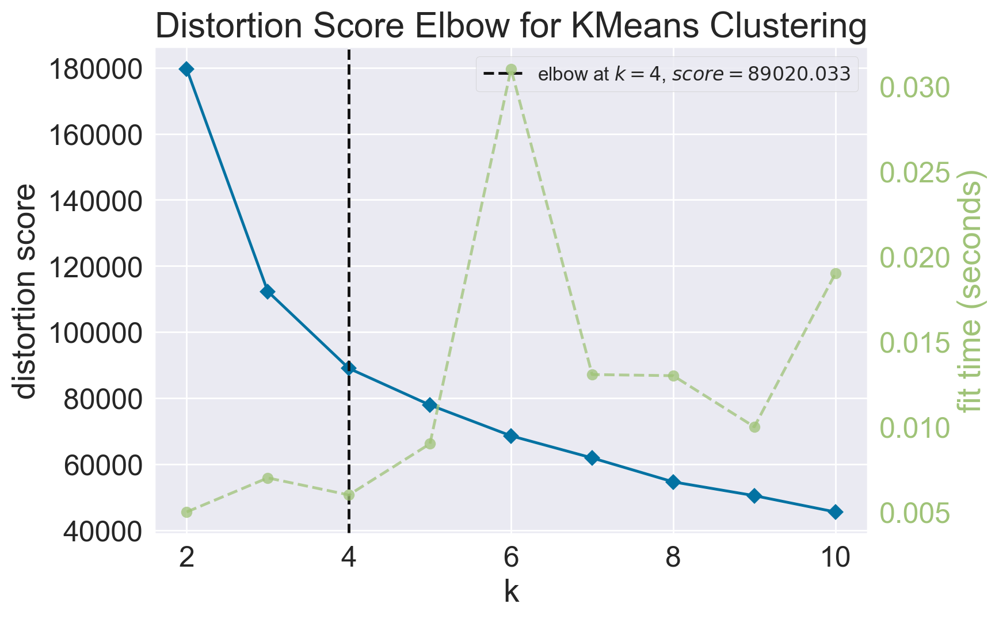

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [108]:
# Quick examination of elbow method to find numbers of clusters to make
from yellowbrick.cluster import KElbowVisualizer
from sklearn.cluster import KMeans

Elbow_M = KElbowVisualizer(KMeans(), k=10)
Elbow_M.fit(PCA_df)
Elbow_M.show()

The above cell indicates that 4 will be the optimal number of clusters here

In [109]:
#Next, we will be fitting the Agglomerative Clustering Model to get the final clusters.

from sklearn.cluster import AgglomerativeClustering

#Initiating the Agglomerative Clustering model 
AC = AgglomerativeClustering(n_clusters=4,linkage='ward')
# fit model and predict clusters
yhat_kmeans = AC.fit_predict(PCA_df)
PCA_df["Clusters"] = yhat_kmeans
#Adding the Clusters feature to the orignal dataframe.
full_df["Clusters"]= yhat_kmeans

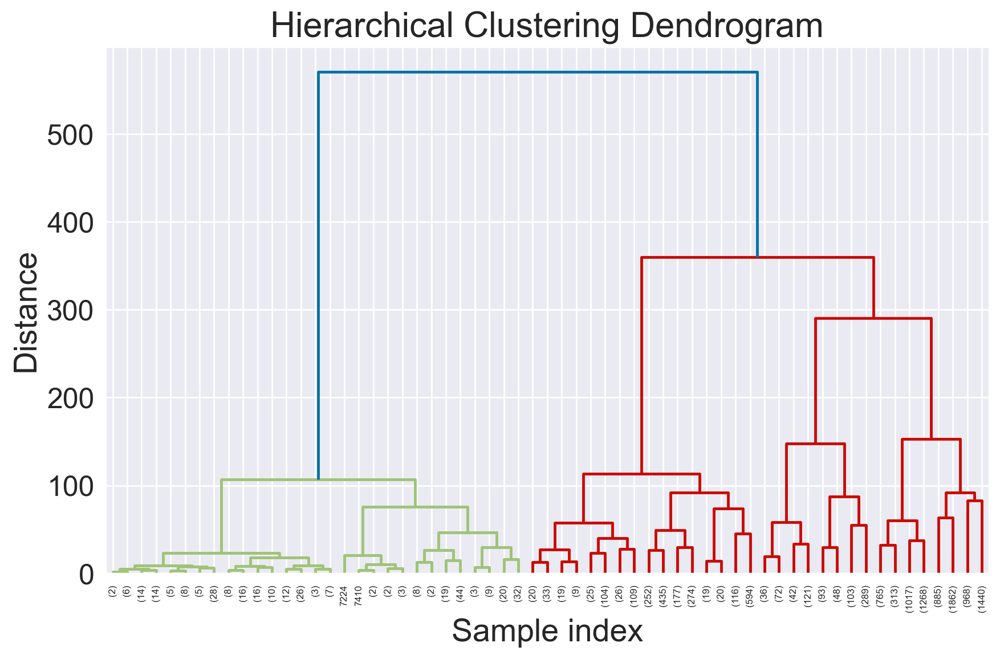

In [110]:
from scipy.cluster.hierarchy import dendrogram, linkage
import matplotlib.pyplot as plt

linked = linkage(PCA_df[['col1', 'col2', 'col3']], method='ward')

plt.figure(figsize=(10, 6))
dendrogram(linked, truncate_mode='level', p=5)  # p=levels shown
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Sample index')
plt.ylabel('Distance')
plt.show()


In [111]:
from sklearn.metrics import silhouette_score

# Ensure your features are the PCA-reduced ones
X = PCA_df[['col1', 'col2', 'col3']]
labels = PCA_df['Clusters']

# Calculate silhouette score
score = silhouette_score(X, labels)
print(f'Silhouette Score: {score:.4f}')


Silhouette Score: 0.5184


This indicates that the data points within the cluster shows good cohesion(similarity) compared to other clusters(separation)

In [112]:
#Plotting the clusters
fig = px.scatter_3d(
    PCA_df, 
    x=PCA_df['col1'], 
    y=PCA_df['col2'], 
    z=PCA_df['col3'],
    color='Clusters',
    hover_data=['Clusters'],
    title='3D PCA Projection of Stock Data by Cluster'
)
fig.show()

## Evaluating Models

Since this is an unsupervised clustering. We do not have a tagged feature to evaluate or score our model. The purpose of this section is to study the patterns in the clusters formed and determine the nature of the clusters' patterns.

For that, we will be having a look at the data in light of clusters via exploratory data analysis and drawing conclusions.

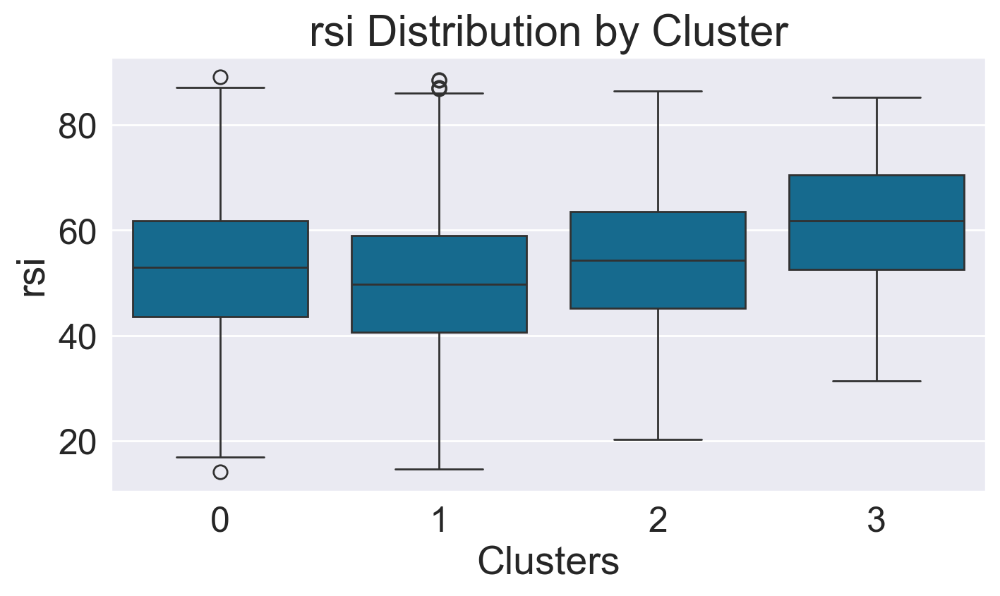

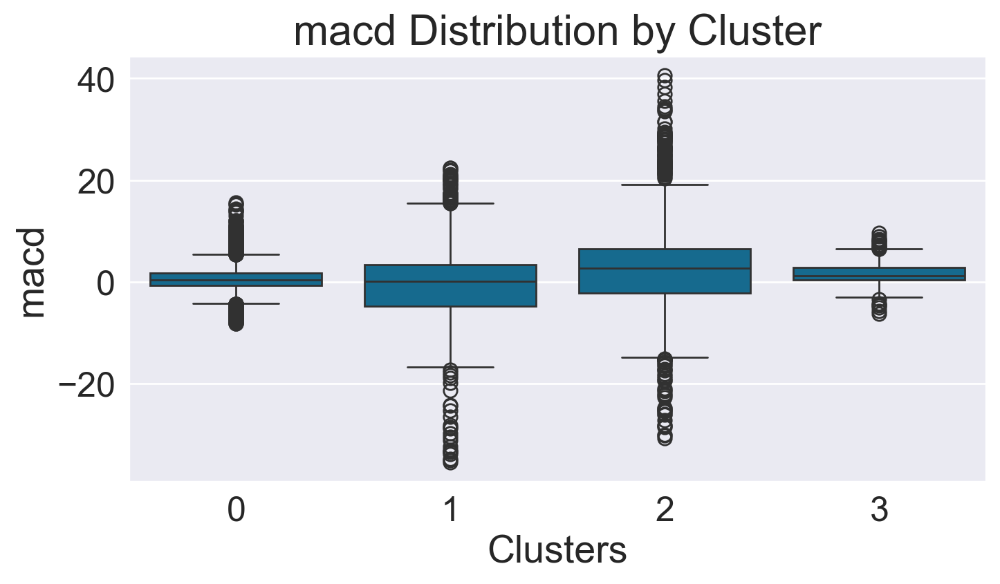

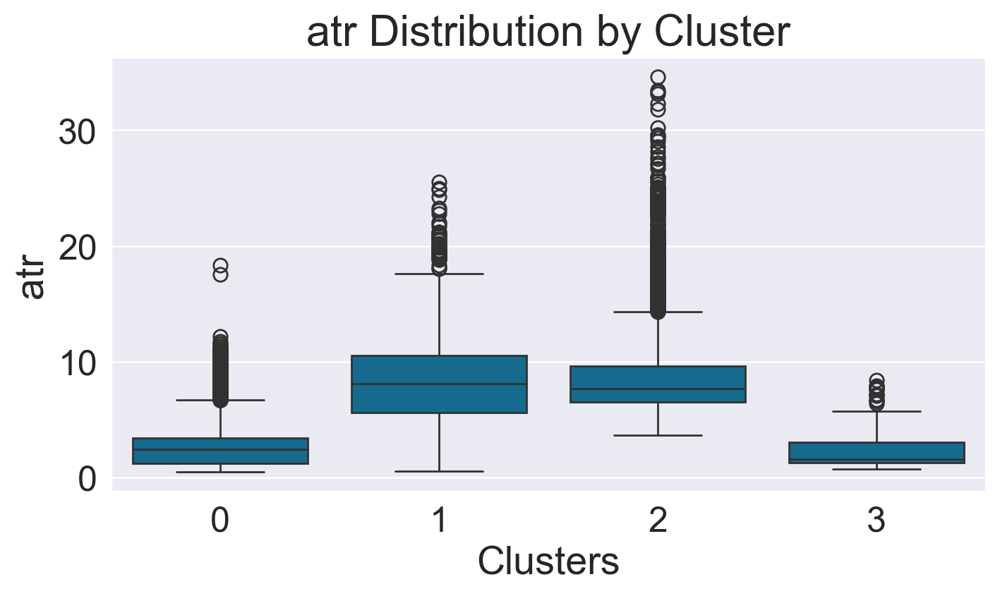

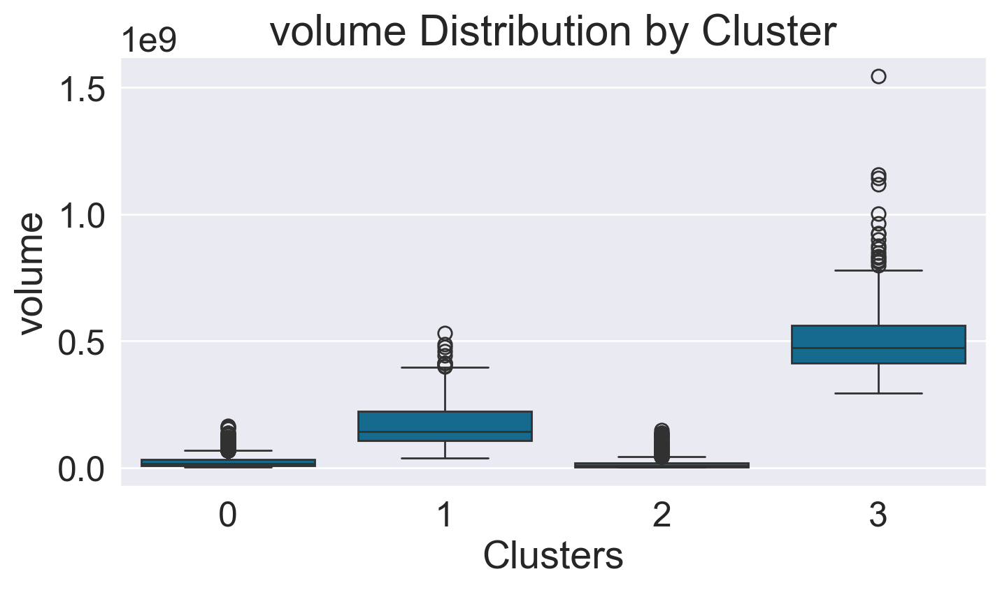

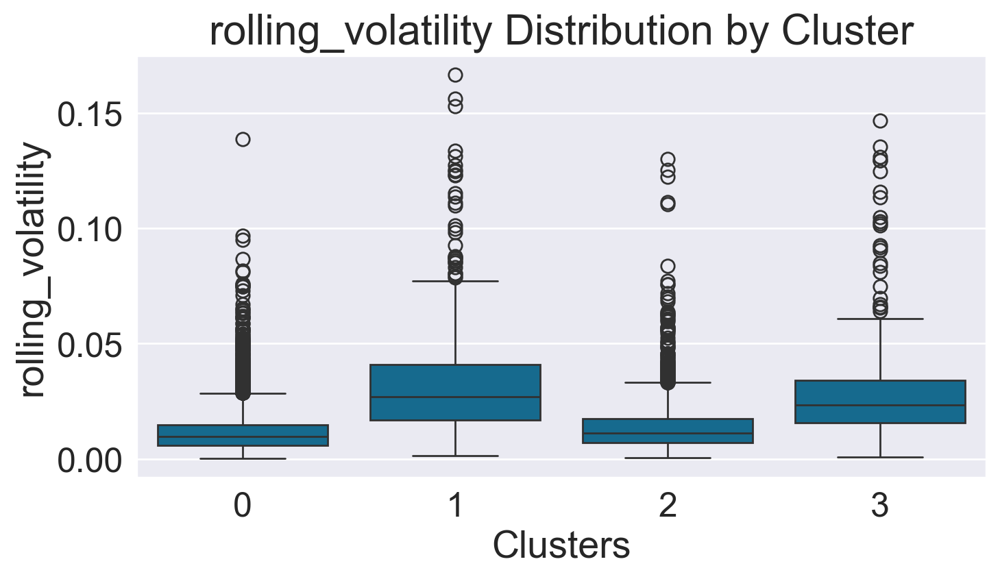

In [113]:
# Grouping and comparing feature summaries by cluster
# Feature distribution per cluster
for col in ['rsi','macd','atr','volume','rolling_volatility']:
    plt.figure(figsize=(8,4))
    sns.boxplot(data=full_df,x='Clusters',y=col)
    plt.title(f'{col} Distribution by Cluster')
    plt.show()

In [114]:
# Summarizing the clusters
summary = full_df.groupby('Clusters').agg({
    'rsi': 'median',
    'macd': 'median',
    'atr': 'median',
    'rolling_volatility': 'median',
    'volume': 'median'
}).round(2)

print(summary)

            rsi  macd   atr  rolling_volatility       volume
Clusters                                                    
0         53.03  0.30  2.42                0.01   14733400.0
1         49.82  0.03  8.09                0.03  142291750.0
2         54.32  2.65  7.66                0.01    7227500.0
3         61.86  1.14  1.56                0.02  474040500.0


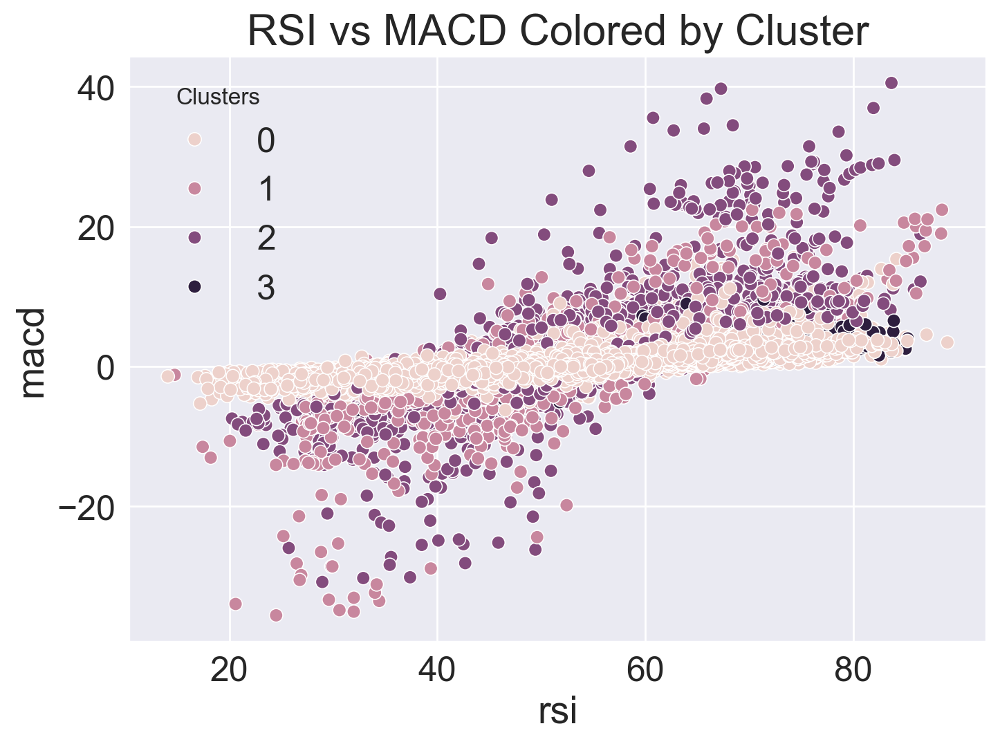

In [115]:
# Visualising cluster separations
sns.scatterplot(data=full_df,x='rsi',y='macd',hue='Clusters')
plt.title('RSI vs MACD Colored by Cluster')
plt.show()

In [116]:
# Visualising clusters in a Bubble Chart

summary = summary.reset_index()

fig = px.scatter(
    summary,
    x='atr',
    y='macd',
    size = 'volume',
    color = 'Clusters',
    hover_data=['rsi','rolling_volatility'],
    title = '📊 Cluster Summary: Volatility vs Momentum',
    labels = {
        'atr': 'ATR (Volatility Range)',
        'macd' : 'MACD(Momentum)',
        'volume' : 'Volume (Bubble Size)'

    },

)
fig.show()

**From this, we can conclude that the clusters can be described as follows:**

| Cluster | Description                         | Key Traits                                                                                                                  | Likely Behavior                                                                                                                 |
| ------- | ----------------------------------- | --------------------------------------------------------------------------------------------------------------------------- | ------------------------------------------------------------------------------------------------------------------------------- |
| **0**   | 🟦 **Stable Stocks**                | RSI \~53, mild MACD (0.30), **low ATR (2.42)**, low volatility (0.01), moderate volume (\~14M)                              | ✅ **Low-risk, steady movers** — likely **range-bound** or **consolidating stocks**, good for conservative strategies.           |
| **1**   | 🟥 **Volatile with No Clear Trend** | RSI \~49 (neutral), MACD \~0, **very high ATR (8.09)**, highest volatility (0.03), high volume (\~142M)                     | ⚠️ **Choppy, directionless behavior** — these may be **news-driven, speculative, or earnings-reactive stocks**.                 |
| **2**   | 🟩 **Momentum, Low-Volume Movers**  | RSI \~54, **very high MACD (2.65)**, high ATR (7.66), low volatility (0.01), **lowest volume (\~7M)**                       | 🚀 **Momentum plays with low liquidity** — may include **small-cap growth or breakout candidates**; risk-reward is higher.      |
| **3**   | 🟨 **Bullish & Highly Traded**      | **Highest RSI (61.86)**, strong MACD (1.14), **lowest ATR (1.56)**, mid-high volatility (0.02), **highest volume (\~474M)** | 🏆 **Large-cap trending leaders** — strong bullish momentum and volume. Possibly **FAANG-like or high institutional interest**. |


**We can also align our strategy for investing:** 

| Investor Type                                     | Recommended Cluster(s)             | Rationale                                                                                                                            |
| ------------------------------------------------- | ---------------------------------- | ------------------------------------------------------------------------------------------------------------------------------------ |
| **Long-Term Investors / Low-Risk Profiles**       | 🟦 **Cluster 0**                   | Stable price action, low volatility and ATR — ideal for buy-and-hold or dividend strategies.                                         |
| **Swing / Momentum Traders**                      | 🟩 **Cluster 2**                   | High MACD and RSI, with thin liquidity — perfect for capturing short-term price surges.                                              |
| **Institutional Investors / High-Volume Traders** | 🟥 **Cluster 1**, 🟨 **Cluster 3** | High volume and volatility (Cluster 1) or trending large-cap movers (Cluster 3). Suitable for big orders and trend-based strategies. |


In [117]:
#Finally, we will map the decided labels to the cluster column
cluster_descriptions = {
    0: "Stable Stocks",
    1: "Volatile with no clear trend",
    2: "Momentum, Low-Volume Movers",
    3: "Bullish and Highly Traded"
}

# Add the descriptions to the DataFrame
full_df['Cluster_label'] = full_df['Clusters'].map(cluster_descriptions)